In [ ]:
# Downloading data from GIT
!git clone https://github.com/rslim087a/track

Cloning into 'track'...
remote: Enumerating objects: 12163, done.
remote: Total 12163 (delta 0), reused 0 (delta 0), pack-reused 12163
Receiving objects: 100% (12163/12163), 156.98 MiB | 32.60 MiB/s, done.
Updating files: 100% (12160/12160), done.


In [ ]:
import os
import pandas as pd
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from imgaug import augmenters as iaa
import cv2
import ntpath
import random


In [ ]:
# Making the csv file for usage, by naming the columns
data_dir ='/content/track'
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
df = pd.read_csv(os.path.join(data_dir,'/content/track/driving_log.csv'), names = columns)
df.head()

,center,left,right,steering,throttle,reverse,speed
0,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


In [ ]:
# To display full data name in df
pd.set_option('display.max_colwidth', None)
df.head()

,center,left,right,steering,throttle,reverse,speed
0,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


In [ ]:
# Now changing the path name of the images
def path_change(path):
  head, tail =ntpath.split(path)
  return tail
df['center'] = df['center'].apply(path_change)
df['left'] = df['left'].apply(path_change)
df['right'] = df['right'].apply(path_change)
df.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2018_07_16_17_11_43_382.jpg,left_2018_07_16_17_11_43_382.jpg,right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,center_2018_07_16_17_11_43_670.jpg,left_2018_07_16_17_11_43_670.jpg,right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,center_2018_07_16_17_11_43_724.jpg,left_2018_07_16_17_11_43_724.jpg,right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,center_2018_07_16_17_11_43_792.jpg,left_2018_07_16_17_11_43_792.jpg,right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,center_2018_07_16_17_11_43_860.jpg,left_2018_07_16_17_11_43_860.jpg,right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


<BarContainer object of 25 artists>

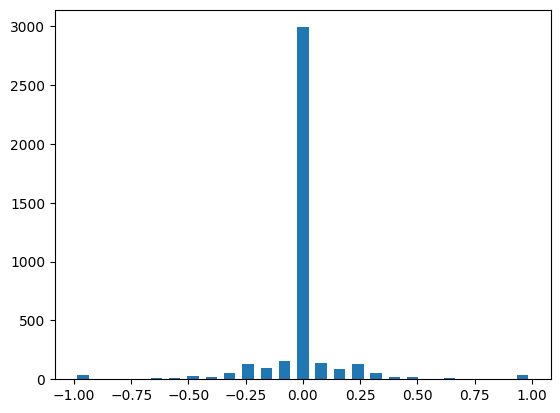

In [ ]:
# Visualizing the data

num_bins = 25
hist, bins = np.histogram(df['steering'], num_bins)
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)

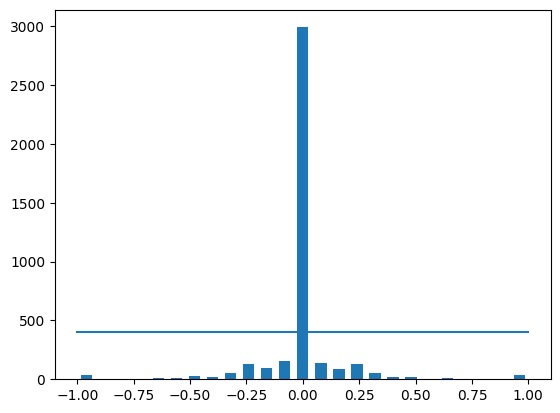

In [ ]:
# Since we are having data traind to drive at center, so our data is biased to 0
# to deal with that we will draw a line to cut out extra 0 data points
num_bins = 25
samples_per_bin = 400
hist, bins = np.histogram(df['steering'], num_bins)
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(df['steering']),np.max(df['steering'])),(samples_per_bin, samples_per_bin))

In [ ]:
df.shape

(4053, 7)

In [ ]:
# we will balance the data by removing the data after threshold of sample
remove_list = []
for i in range(num_bins):
  list_ = []
  for j in range(len(df['steering'])):
    if df['steering'][j] >= bins[i] and df['steering'][j] <= bins[i+1]:
      list_.append(j)
  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_)

print('removed:', len(remove_list))
df.drop(df.index[remove_list], inplace = True)
print('remaining', len(df))

removed: 2590
remaining 1463


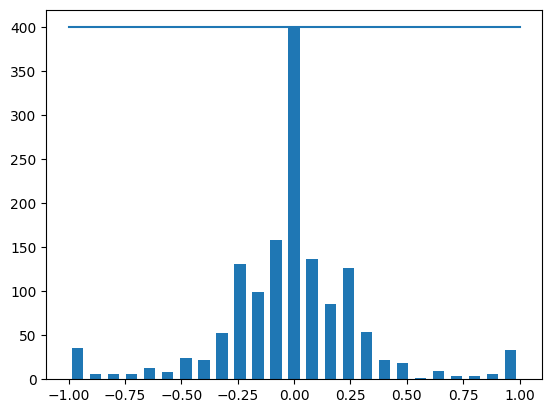

In [ ]:
# Again plotting the histogram
hist, _ = np.histogram(df['steering'],(num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(df['steering']),np.max(df['steering'])),(samples_per_bin, samples_per_bin))

In [ ]:
# loading images to train the data

def load_img_steering(data_dir,df):
  image_path = []
  steering = []

  for i in range(len(df)):
    indexed_data = df.iloc[i]
    center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]

    # Joining for center images
    image_path.append(os.path.join(data_dir, center.strip()))
    steering.append(float(indexed_data[3]))

    # Joining for left images
    image_path.append(os.path.join(data_dir, left.strip()))
    steering.append(float(indexed_data[3])+0.15)

    #Joining for right images
    image_path.append(os.path.join(data_dir, right.strip()))
    steering.append(float(indexed_data[3])-0.15)

  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings

In [ ]:
image_paths, steerings = load_img_steering(data_dir + '/IMG',df)

In [ ]:
image_paths, steerings

(array(['/content/track/IMG/center_2018_07_16_17_11_43_382.jpg',
        '/content/track/IMG/left_2018_07_16_17_11_43_382.jpg',
        '/content/track/IMG/right_2018_07_16_17_11_43_382.jpg', ...,
        '/content/track/IMG/center_2018_07_16_17_16_31_400.jpg',
        '/content/track/IMG/left_2018_07_16_17_16_31_400.jpg',
        '/content/track/IMG/right_2018_07_16_17_16_31_400.jpg'],
       dtype='<U53'),
 array([ 0.  ,  0.15, -0.15, ...,  0.  ,  0.15, -0.15]))

In [ ]:
print(len(image_paths),len( steerings))

4389 4389


In [ ]:
# Doin the train- test split of the data
X_train, X_test, y_train, y_test = train_test_split(image_paths, steerings, test_size = 0.2, random_state=42)

print(len(X_train), len(X_test), len(y_train), len(y_test))

3511 878 3511 878


Text(0.5, 1.0, 'Testing_set')

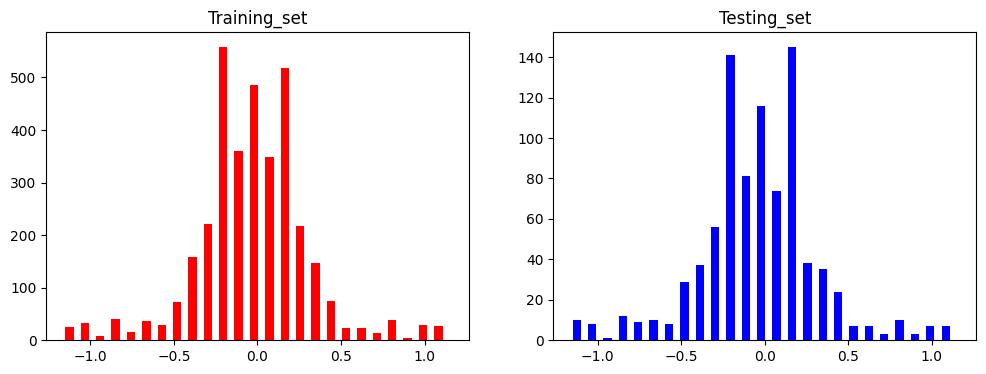

In [ ]:
# Visualization od the train - test data distribution

fig, axis = plt.subplots(1,2, figsize=(12,4))
axis[0].hist(y_train, bins = num_bins, width = 0.05, color = 'red')
axis[0].set_title('Training_set')
axis[1].hist(y_test, bins = num_bins, width = 0.05, color = 'blue')
axis[1].set_title('Testing_set')

In [ ]:
# Now we will do data augmentation to increase the data

def zoom(image):
  zoom = iaa.Affine(scale=(1,1.5))
  image = zoom.augment_image(image)
  return image

image = image_paths[random.randint(0,1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)



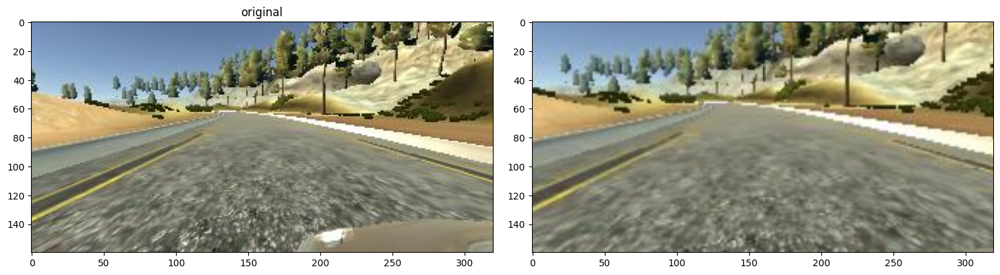

In [ ]:
# Visualizing the zoomed image
fig, axis = plt.subplots(1,2, figsize = (15,10))
fig.tight_layout()

axis[0].imshow(original_image)
axis[0].set_title('original')
axis[1].imshow(zoomed_image)

In [ ]:
def pan(image):
  pan = iaa.Affine(translate_percent = {"x" :(-0.1, 0.1),"y" :(-0.1, 0.1)})
  image = pan.augment_image(image)
  return image

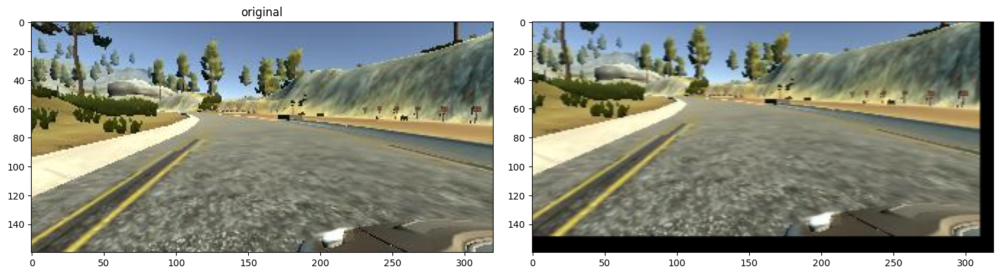

In [ ]:
image = image_paths[random.randint(0,1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)


# Visualizing the panned image
fig, axis = plt.subplots(1,2, figsize = (15,10))
fig.tight_layout()

axis[0].imshow(original_image)
axis[0].set_title('original')
axis[1].imshow(panned_image)

In [ ]:
def img_random_brightness(image):
  brightness = iaa.Multiply((0.2,1.2))
  image = brightness.augment_image(image)
  return image

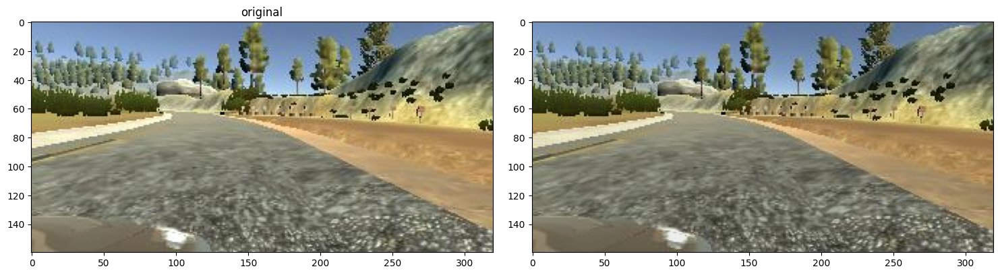

In [ ]:
image = image_paths[random.randint(0,1000)]
original_image = mpimg.imread(image)
brightned_image = img_random_brightness(original_image)


# Visualizing the brightened image
fig, axis = plt.subplots(1,2, figsize = (15,10))
fig.tight_layout()

axis[0].imshow(original_image)
axis[0].set_title('original')
axis[1].imshow(brightned_image)

In [ ]:
def img_random_flip(image,steering_angle):
  image = cv2.flip(image,1)
  steering_angle = -steering_angle
  return image, steering_angle

Text(0.5, 1.0, "new',0.2")

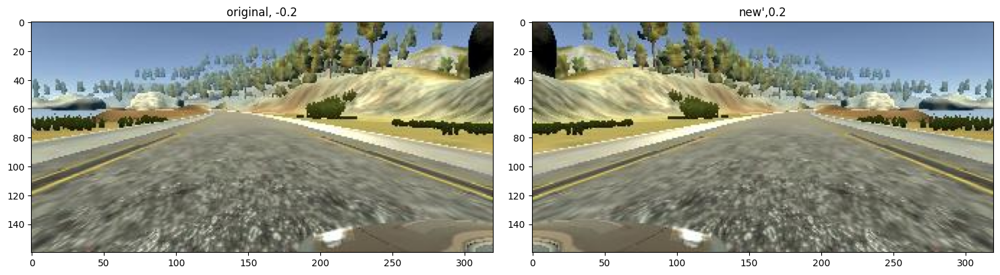

In [ ]:
random_index = random.randint(0,1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]

original_image - mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image,steering_angle)


# Visualizing the flipped image
fig, axis = plt.subplots(1,2, figsize = (15,10))
fig.tight_layout()

axis[0].imshow(original_image)
axis[0].set_title(f"original, {steering_angle}")
axis[1].imshow(flipped_image)
axis[1].set_title(f"new',{flipped_steering_angle}")

In [ ]:
# To randomize the augmentation on data set

def random_augmentation(image, steering_angle):
  image = mpimg.imread(image)
  if np.random.rand() < 0.5:
    image = zoom(image)
  if np.random.rand() < 0.5:
    image = pan(image)
  if np.random.rand() < 0.5:
    image = img_random_brightness(image)
  if np.random.rand() < 0.5:
    image, steering_angle = img_random_flip(image, steering_angle)

  return image, steering_angle

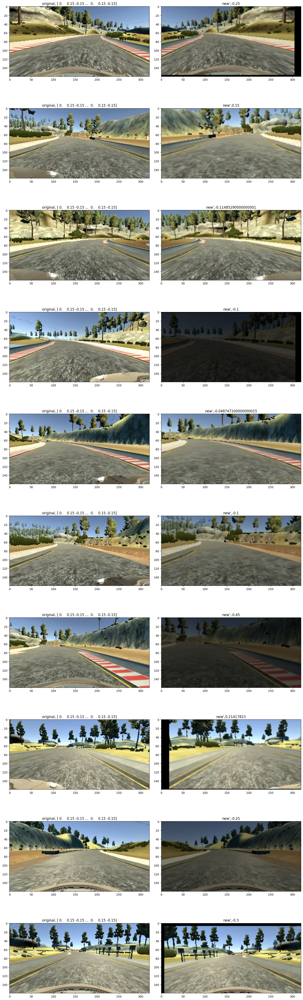

In [ ]:
# Just a test and visualize to see the augmentation

nth_row = 10
nth_column = 2

fig, axis = plt.subplots(nth_row, nth_column, figsize=(15,50))
fig.tight_layout()

for i in range(10):
  randnum = random.randint(0, len(image_paths)- 1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]

  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augmentation(random_image, random_steering)


  axis[i][0].imshow(original_image)
  axis[i][0].set_title(f"original, {steerings}")
  axis[i][1].imshow(augmented_image)
  axis[i][1].set_title(f"new',{steering}")

Pre processing steps

In [ ]:
# Crop image to remove the horizon background

def img_preprocess(img):

  # to crop[row,columns,colour]
  img = img[60:140,:,:]

  #Convert RGB to YUV for nvdia model architecture.
  img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)

  #Gaussian blur to reduce noise
  img = cv2.GaussianBlur(img, (3,3), 0)

  # to resize.
  img = cv2.resize(img, (200, 66))

  # to normalize the vectors.
  img = img/255

  return img



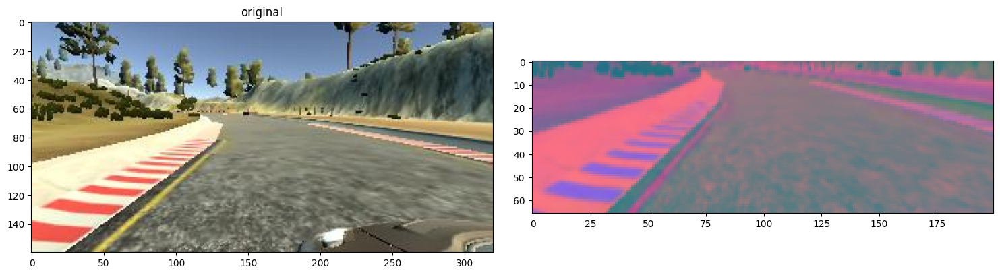

In [ ]:
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)


# Visualizing the preprocessed image
fig, axis = plt.subplots(1,2, figsize = (15,10))
fig.tight_layout()

axis[0].imshow(original_image)
axis[0].set_title('original')
axis[1].imshow(preprocessed_image)

Batch Generator

In [ ]:
# Batch generator with augmentation on train data

def batch_generator(image_paths, steering_ang, batch_size, is_training):

  while True:
    batch_img = []
    batch_steering = []

    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths)- 1)

      if is_training:
        im, steering = random_augmentation(image_paths[random_index], steering_ang[random_index])

      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]

      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield(np.asarray(batch_img), np.asarray(batch_steering))

In [ ]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1 , 1))
x_test_gen, y_test_gen = next(batch_generator(X_test, y_test, 1 , 0))

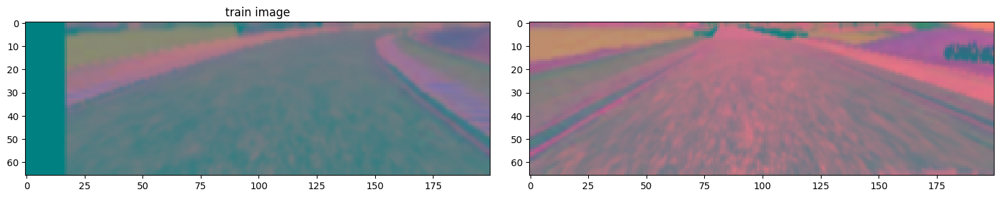

In [ ]:
# Visualizing the batch image

fig, axis = plt.subplots(1,2, figsize = (15,10))
fig.tight_layout()

axis[0].imshow(x_train_gen[0])
axis[0].set_title('train image')
axis[1].imshow(x_test_gen[0])

Creating the Model

In [ ]:
def model_01():

  # define the model
  model = Sequential()


  model.add(Conv2D(24, (5,5), strides = (2,2), input_shape =(66, 200, 3), activation = 'elu'))
  model.add(Conv2D(36, (5,5), strides = (2,2), activation = 'elu'))
  model.add(Conv2D(48, (5,5), strides = (2,2), activation = 'elu'))
  model.add(Conv2D(64, (5,5), activation = 'elu'))

  model.add(Flatten())

  model.add(Dropout(0.5))

  model.add(Dense(100, activation = 'elu'))
  model.add(Dense(50, activation = 'elu'))
  model.add(Dense(10, activation = 'elu'))
  model.add(Dense(1))

  model.add(Dropout(0.5))

  optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
  model.compile(loss='mse', optimizer = optimizer)
  return model

model = model_01()
print(model.summary())


Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_32 (Conv2D)          (None, 31, 98, 24)        1824      
                                                                 
 conv2d_33 (Conv2D)          (None, 14, 47, 36)        21636     
                                                                 
 conv2d_34 (Conv2D)          (None, 5, 22, 48)         43248     
                                                                 
 conv2d_35 (Conv2D)          (None, 1, 18, 64)         76864     
                                                                 
 flatten_8 (Flatten)         (None, 1152)              0         
                                                                 
 dropout_6 (Dropout)         (None, 1152)              0         
                                                                 
 dense_32 (Dense)            (None, 100)              

In [ ]:
history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),
                    steps_per_epoch = 300,
                    epochs = 10,
                    validation_data = batch_generator(X_test, y_test, 100, 1),
                    validation_steps = 200,
                    verbose = 1,
                    shuffle= 1)

<ipython-input-125-3511699c5157>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),


Epoch 1/10
300/300 [==============================] - 362s 1s/step - loss: 0.1712 - val_loss: 0.1012
Epoch 2/10
300/300 [==============================] - 400s 1s/step - loss: 0.0955 - val_loss: 0.0922
Epoch 3/10
300/300 [==============================] - 403s 1s/step - loss: 0.0940 - val_loss: 0.0886
Epoch 4/10
300/300 [==============================] - 391s 1s/step - loss: 0.0929 - val_loss: 0.0856
Epoch 5/10
300/300 [==============================] - 390s 1s/step - loss: 0.0902 - val_loss: 0.0798
Epoch 6/10
300/300 [==============================] - 395s 1s/step - loss: 0.0878 - val_loss: 0.0842
Epoch 7/10
300/300 [==============================] - 346s 1s/step - loss: 0.0860 - val_loss: 0.0854
Epoch 8/10
300/300 [==============================] - 388s 1s/step - loss: 0.0857 - val_loss: 0.0764
Epoch 9/10
300/300 [==============================] - 338s 1s/step - loss: 0.0840 - val_loss: 0.0766
Epoch 10/10
300/300 [==============================] - 392s 1s/step - loss: 0.0849 - val_lo

Text(0.5, 0, 'epoch')

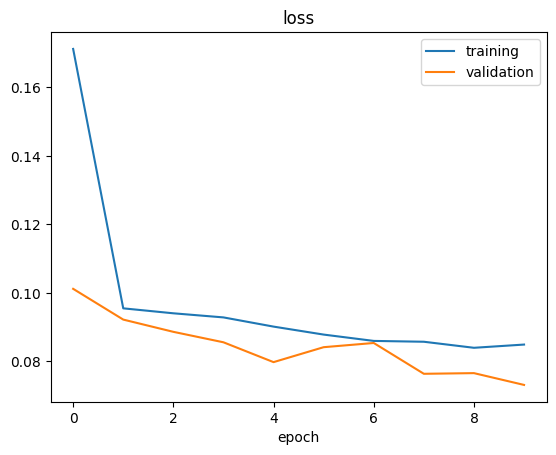

In [ ]:
# Visualization of the losses

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training','validation'])
plt.title('loss')
plt.xlabel('epoch')

In [ ]:
# saving the model

model.save('model.h5')
from google.colab import files
files.download('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>